In [1]:
import sys
import torch
import matplotlib

import numpy as np
import torch.nn as nn
import matplotlib.pyplot as plt

from pathlib import Path 

sys.path.append(str(Path.cwd().parent.parent))
from kymatio.scattering2d.core.scattering2d import scattering2d
from kymatio import Scattering2D
from parametricSN.models.create_filters import *
from parametricSN.models.sn_base_models import sn_ScatteringBase


In [2]:
filterDists = {}
params_dict = {}

filterDists['cifar'] = torch.load('../../params/cifar_qualitative_distance.pt')
params_dict['cifar'] = torch.load('../../params/cifar_qualitative_params.pt')

filterDists['kth'] = torch.load('../../params/KTH_qualitative_distance.pt')
params_dict['kth'] = torch.load('../../params/KTH_qualitative_params.pt')

filterDists['xray'] = torch.load('../../params/x-ray_qualitative_distance.pt')
params_dict['xray'] = torch.load('../../params/x-ray_qualitative_params.pt')

In [3]:
def format_params(temp):
    temp['angle'].requires_grad = False
    temp['params'].requires_grad = False
    l = [nn.Parameter(temp['angle'])]
#     print(l[0].shape)
    for i in range(temp['params'].size(1)):
#         print(temp['params'].shape)
        l.append(nn.Parameter(temp['params'][:,i]))
    return l

In [4]:
filters = {
    'cifar':format_params(params_dict['cifar'][-1]),
    'kth':format_params(params_dict['kth'][-1]),
    'xray':format_params(params_dict['xray'][-1]),
    'tf2':format_params(params_dict['cifar'][0]), #filters init at TF
    'tf4':format_params(params_dict['kth'][0]) #filters init at TF
}

In [5]:
def get_first_row(psi, J, L, mode ='fourier',rows=3):
    """ Visualizes the scattering filters input for different modes

    parameters:
        psi  --  dictionnary that contains all the wavelet filters
        L    --  number of orientation
        J    --  scattering scale
        mode -- mode between fourier (in fourier space), real (real part) 
                or imag (imaginary part)
    returns:
        f -- figure/plot
    """
    n_filters =0
    for j in range(2, J+1):
        n_filters+=  j* L
    num_rows = rows
    num_col = L
    f, axarr = plt.subplots(num_rows, num_col, figsize=(20, 2*num_rows))
    start_row = 0
    for scale in range(J-1):
        count = L * scale
        end_row = (J-scale) + start_row 
        for i in range(start_row, num_rows) :
          
          for j in range(0, L) :
              if mode =='fourier':
                  x = np.fft.fftshift(psi[count][scale].squeeze().cpu().detach().numpy()).real
              elif mode == 'real':
                  x = np.fft.fftshift(np.fft.ifft2(psi[count][scale].squeeze().cpu().detach().numpy())).real
              elif mode == 'imag':
                  x = np.fft.fftshift(np.fft.ifft2(psi[count][scale].squeeze().cpu().detach().numpy())).imag
              else:
                  raise NotImplemented(f"Model {params['name']} not implemented")
              
              a = np.abs(x).max()
              axarr[i,j].imshow(x, vmin=-a, vmax=a)
              # axarr[i,j].set_title(f"J:{psi[count]['j']} L: {psi[count]['theta']}, S:{scale} ")
              axarr[i,j].axis('off')
              count = count +1
              axarr[i,j].set_xticklabels([])
              axarr[i,j].set_yticklabels([])
              axarr[i,j].set_aspect('equal')
              if i % 2 == 0:
                axarr[i,j].patch.set_facecolor("blue")
              else:
                axarr[i,j].patch.set_facecolor("red")
        start_row = end_row
        # if i == num_rows:          
        #   break

    f.subplots_adjust(wspace=0, hspace=0.2)
    return f

In [6]:

def vzFilters(S, filterList, topRow=False, J=2,rows=3):
  params = [y.type(torch.float32) for y in filterList]
#   S.params_filters = params
#   for i in range(0, len(filterList)):
#     S.params_filters[i] = nn.Parameter(filterList[i])
#     S.register_parameter(name='scattering_params_'+str(i), param=S.params_filters[i])
  S.update_parameters__(filterList)
    
  S.params_filters = nn.ParameterList(S.params_filters)
  S.wavelets = morlets(S.grid, S.params_filters[0], 
                                      S.params_filters[1], S.params_filters[2], 
                                      S.params_filters[3])
                                      
  S.psi = update_psi(J=S.J, psi=S.psi, wavelets=S.wavelets) 
#   S.params_filters = params
  filter_viz = {}
  for mode in ['fourier']:#,'real', 'imag' ]: # visualize wavlet filters before training
      if topRow:
        f = get_first_row(S.psi, J, 8, mode=mode,rows=rows)
      else:
        f = get_filters_visualization(S.psi, J, 8, mode=mode) 

        
      filter_viz[mode] = f

  return f  

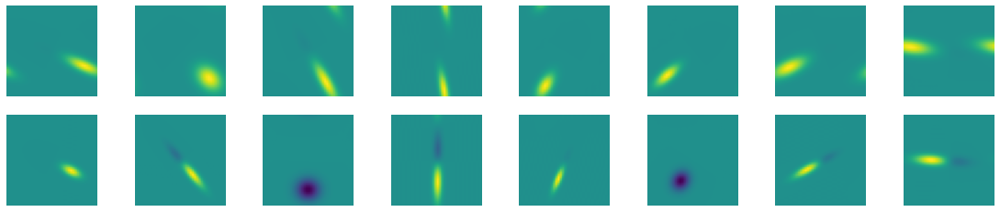

In [7]:

S2 = sn_ScatteringBase(2, 32, 32, False, 'Tight-Frame', True, monitor_filters=False, filter_video=True)
S4 = sn_ScatteringBase(4, 32, 32, False, 'Tight-Frame', True, monitor_filters=False, filter_video=True)


matplotlib.rc('image', cmap='viridis')
p = vzFilters(S2, filters['cifar'],topRow=True,J=2,rows=2)


In [8]:



def raw_morlets(grid_or_shape, wave_vectors, gaussian_bases, 
                morlet=True, ifftshift=True, fft=True):
    """ Helper function for creating morlet filters
        Parameters:
            grid_or_shape -- a grid of the size of the filter or a tuple that indicates its shape
            wave_vectors -- directions of the wave part of the morlet wavelet
            gaussian_bases -- bases of the gaussian part of the morlet wavelet
            morlet -- boolean for morlet or gabor wavelet
            ifftshift -- boolean for the ifftshift (inverse fast fourier transform shift)
            fft -- boolean for the fft (fast fourier transform)
        Returns:
            filters -- the wavelet filters before normalization
            
    """
    n_filters, n_dim = wave_vectors.shape
    assert gaussian_bases.shape == (n_filters, n_dim, n_dim)

    if isinstance(grid_or_shape, tuple):
        shape = grid_or_shape
        ranges = [torch.arange(-(s // 2), -(s // 2) + s, dtype=torch.float) for s in shape]
        grid = torch.stack(torch.meshgrid(*ranges), 0)
    else:
        shape = grid_or_shape.shape[1:]
        grid = grid_or_shape

    waves = torch.exp(1.0j * torch.matmul(grid.T, wave_vectors.T).T)
    gaussian_directions = torch.matmul(grid.T, gaussian_bases.T.reshape(n_dim, n_dim * n_filters)).T
    gaussian_directions = gaussian_directions.reshape((n_dim, n_filters) + shape)
    radii = torch.norm(gaussian_directions, dim=0)
    gaussians = torch.exp(-0.5 * radii ** 2)
    signal_dims = list(range(1, n_dim + 1))
    gabors = gaussians * waves

    if morlet:
        gaussian_sums = gaussians.sum(dim=signal_dims, keepdim=True)
        gabor_sums = gabors.sum(dim=signal_dims, keepdim=True).real
        morlets = gabors - gabor_sums / gaussian_sums * gaussians
        filters = morlets
    else:
        filters = gabors
        
    if ifftshift:
        filters = torch.fft.ifftshift(filters, dim=signal_dims)
        gabors = torch.fft.ifftshift(gabors, dim=signal_dims)
    if fft:
        filters = torch.fft.fftn(filters, dim=signal_dims)
        gabors = torch.fft.fftn(gabors, dim=signal_dims)
        
    return filters, gabors




def morlets2(grid_or_shape, theta, xis, sigmas, slants, morlet=True, 
             ifftshift=True, fft=True, return_gabors=False):
    """Creates morlet wavelet filters from inputs
        Parameters:
            grid_or_shape -- a grid of the size of the filter or a tuple that indicates its shape
            theta -- global orientations of the wavelets
            xis -- frequency scales of the wavelets
            sigmas -- gaussian window scales of the wavelets
            slants -- slants of the wavelets
            morlet -- boolean for morlet or gabor wavelet
            ifftshift -- boolean for the ifftshift (inverse fast fourier transform shift)
            fft -- boolean for the fft (fast fourier transform)
        Returns:
            wavelets -- the wavelet filters
    """
    orientations = torch.cat((torch.cos(theta).unsqueeze(1),torch.sin(theta).unsqueeze(1)), dim =1)
    n_filters, ndim = orientations.shape
    wave_vectors = orientations * xis[:, np.newaxis]
    _, _, gauss_directions = torch.linalg.svd(orientations[:, np.newaxis])
    gauss_directions = gauss_directions / sigmas[:, np.newaxis, np.newaxis]
    
    indicator = torch.arange(ndim, device=slants.device) < 1
    slant_modifications = (1.0 * indicator + slants[:, np.newaxis] * ~indicator)
    gauss_directions = gauss_directions * slant_modifications[:, :, np.newaxis]
    wavelets, gabors = raw_morlets(grid_or_shape, wave_vectors, gauss_directions, morlet=morlet, 
                          ifftshift=ifftshift, fft=fft)

    norm_factors = (2 * 3.1415 * sigmas * sigmas / slants).unsqueeze(1)

    if type(grid_or_shape) == tuple:
        norm_factors = norm_factors.expand([n_filters,grid_or_shape[0]]).unsqueeze(2).repeat(1,1,grid_or_shape[1])
    else:
        norm_factors = norm_factors.expand([n_filters,grid_or_shape.shape[1]]).unsqueeze(2).repeat(1,1,grid_or_shape.shape[2])

    wavelets = wavelets / norm_factors
    gabors = gabors / norm_factors
    
    if return_gabors:
      return gabors
    else:
      return wavelets




In [9]:
def lwp(S, filterList):
#     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filterList]
#     S.params_filters = params
    S.update_parameters__(filterList)
    wavelets = morlets(S.grid, S.params_filters[0], 
                                  S.params_filters[1], S.params_filters[2], 
                                  S.params_filters[3]).detach().numpy()
    lp = (np.abs(wavelets) ** 2).sum(0)
    return np.fft.fftshift(lp)

# Single figure regular

tensor([5.4978], grad_fn=<SliceBackward>)
tensor([1.1781], grad_fn=<SliceBackward>)
tensor([1.6000], grad_fn=<SliceBackward>)
tensor([0.5000], grad_fn=<SliceBackward>)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(4, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(7, 2)
(3, 2)
(1, 2)
(5, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(3, 2)
(5, 2)
(1, 2)


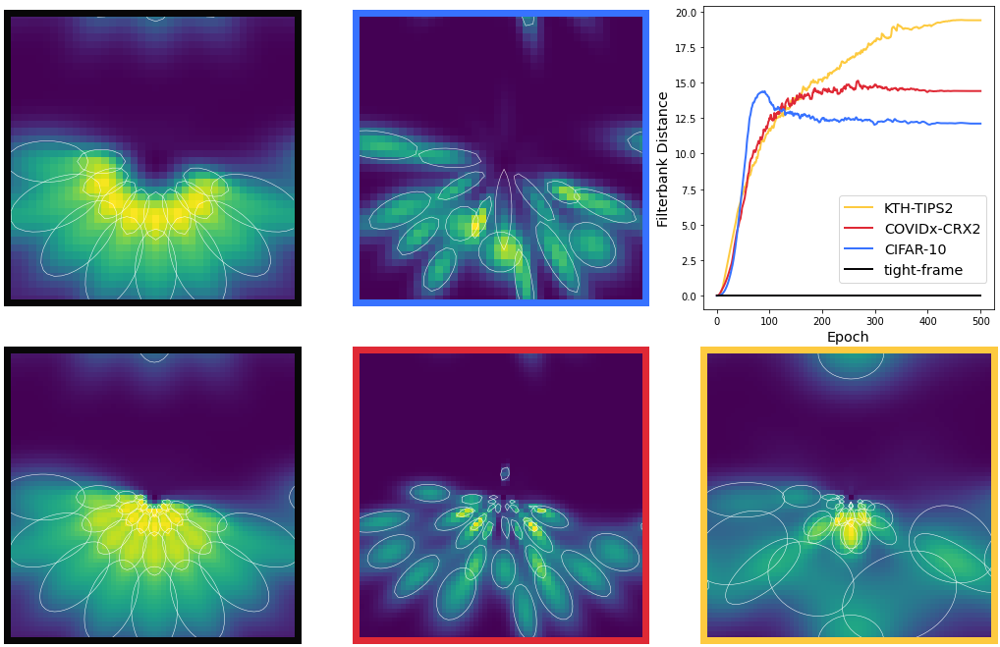

In [10]:
# matplotlib.rc('font',family='TeX Gyre Heros')
fig3 = plt.figure(figsize=(18,12))
# fig3 = plt.figure(figsize=(9,6))
gs = fig3.add_gridspec(4,6,wspace=0.5, hspace=0.25)


f3_ax1 = fig3.add_subplot(gs[0:2,4:6],xlabel="Epoch",ylabel="Filterbank Distance")#0:2,4:6
f3_ax1.set_ylabel("Filterbank Distance", fontsize='x-large')
f3_ax1.set_xlabel("Epoch",fontsize='x-large')
WIDTH = 7
epochs = [x for x in range(len(filterDists['cifar']))]

f3_ax1.plot(epochs, filterDists['kth'], label="KTH-TIPS2", color="#FDCA40", linewidth=2)
f3_ax1.plot(epochs, filterDists['xray'], label="COVIDx-CRX2", color="#DF2935", linewidth=2) 
f3_ax1.plot(epochs, filterDists['cifar'], label="CIFAR-10", color="#3772FF", linewidth=2) 
f3_ax1.plot(epochs, [0 for x in range(len(epochs))], label="tight-frame", color="#080708", linewidth=2)  
#E6E8E6
f3_ax1.legend(fontsize='x-large',bbox_to_anchor=(0.5, 0., 0.5, 0.4)) 


colors = ["#FDCA40","#DF2935","#3772FF","#080708"]
colors = {"tf2":"#080708","tf4":"#080708","kth":"#FDCA40","xray":"#DF2935","cifar":"#3772FF"}

lwptf2 = lwp(S2,filters['tf2'])
lwpcifar2 = lwp(S2,filters['cifar'])
lwptf4 = lwp(S4,filters['tf4'])
lwpxray4 = lwp(S4,filters['xray'])
lwpkth4 = lwp(S4,filters['kth'])

f4_ax_tf2 = fig3.add_subplot(gs[0:2,0:2])#0:2,0:2
f4_ax_tf4 = fig3.add_subplot(gs[2:4,0:2])#2:4,0:2
f4_ax_cifar2 = fig3.add_subplot(gs[0:2,2:4])
f4_ax_xray4 = fig3.add_subplot(gs[2:4,2:4])
f4_ax_kth4 = fig3.add_subplot(gs[2:4,4:6])#2:4,4:6

for g,ax,k,J in [(lwptf2,f4_ax_tf2,'tf2',2),(lwpcifar2,f4_ax_cifar2,'cifar',2),(lwptf4,f4_ax_tf4,'tf4',4),(lwpxray4,f4_ax_xray4,'xray',4),(lwpkth4,f4_ax_kth4,'kth',4)]:
  ax.imshow(g)
  # ax.axis('off')#xmargin=10,ymargin=1)#'off')
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(WIDTH)
  # ax.axes.set_box_aspect(2)
  ax.set_xticklabels([])
  ax.set_yticklabels([])
  ax.set_aspect('equal')
  ax.tick_params(bottom=False,top=False,left=False,right=False)#,color='green', labelcolor='green',)
  for spine in ax.spines.values():
      spine.set_edgecolor(colors[k])

  if J==2:
#     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
#     S2.params_filters = params
    S2.update_parameters__(filters[k])
    gabors2 = morlets2(S2.grid, S2.params_filters[0], 
                                        S2.params_filters[1], S2.params_filters[2], 
                                        S2.params_filters[3], return_gabors=True).cpu().detach().numpy()
    grid = S2.grid + 20
    for i in np.abs(gabors2) ** 2:
      wave = np.fft.fftshift(i.T)
      ax.contour(grid[0], grid[1], wave, 1, colors='white',linewidths=0.5)
  else:
    # print(J)
#     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
#     S4.params_filters = params
    i1 = 0
    i2 = 32
    S4.update_parameters__(filters[k])
    gabors4 = morlets2(S4.grid, S4.params_filters[0][i1:i2], 
                                        S4.params_filters[1][i1:i2], S4.params_filters[2][i1:i2], 
                                        S4.params_filters[3][i1:i2], return_gabors=False).cpu().detach().numpy()
    if k == 'tf4':
        torch.set_printoptions(edgeitems=30)
        for i in range(4):
            print(S4.params_filters[i][13:14])
#         print(gabors4)
            
        
        
    
    grid = S4.grid + 32
    for c,i in enumerate(np.abs(gabors4) ** 2):
      wave = np.fft.fftshift(i.T)
      # print(wave.shape)
      if True:
        ax.contour(grid[0], grid[1], wave, levels=1, colors='white',linewidths=0.5)
        if c <= 32:
            for level in ax.collections:
                for kp,path in reversed(list(enumerate(level.get_paths()))):
                    # go in reversed order due to deletions!

                    # include test for "smallness" of your choice here:
                    # I'm using a simple estimation for the diameter based on the
                    #    x and y diameter...
                    verts = path.vertices # (N,2)-shape array of contour line coordinates
                    set1 = set([x for x in verts[:,0]])
                    set2 = set([x for x in verts[:,1]])
                    
                    diameter = np.max(verts.max(axis=0) - verts.min(axis=0))
                    thresh = np.min([len(set1),len(set2)])
#                     print(diameter,kp,len(path))
                    if thresh==1: # threshold to be refined for your actual dimensions!
                        print(verts.shape)
                        del(level.get_paths()[kp])  # no remove() for Path objects:(

      else:
        ax.contour(grid[0], grid[1], wave, 1, colors='white',linewidths=0.5)

    
fig3.savefig("graph_lwp_w{}_2-3.png".format(WIDTH),bbox_inches='tight',dpi=500)
fig3.savefig("graph_lwp_w{}_2-3.pdf".format(WIDTH),bbox_inches='tight')

# Single Figure small

(16, 40, 40) <class 'numpy.ndarray'>
(16, 40, 40) <class 'numpy.ndarray'>
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(5, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(9, 2)
(1, 2)
(4, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(2, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)


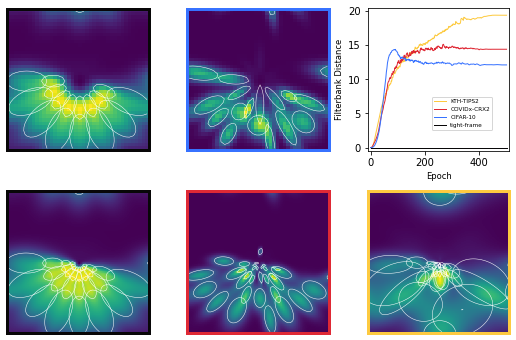

In [11]:
# matplotlib.rc('font',family='TeX Gyre Heros')
# fig3 = plt.figure(figsize=(18,12))
fig3 = plt.figure(figsize=(9,6))
gs = fig3.add_gridspec(4,6,wspace=0.75, hspace=0.75)


f3_ax1 = fig3.add_subplot(gs[0:2,4:6],xlabel="Epoch",ylabel="Filterbank Distance")#0:2,4:6
f3_ax1.set_ylabel("Filterbank Distance", fontsize='small')
f3_ax1.set_xlabel("Epoch",fontsize='small')
WIDTH = 3
epochs = [x for x in range(len(filterDists['cifar']))]

f3_ax1.plot(epochs, filterDists['kth'], label="KTH-TIPS2", color="#FDCA40", linewidth=1)
f3_ax1.plot(epochs, filterDists['xray'], label="COVIDx-CRX2", color="#DF2935", linewidth=1) 
f3_ax1.plot(epochs, filterDists['cifar'], label="CIFAR-10", color="#3772FF", linewidth=1) 
f3_ax1.plot(epochs, [0 for x in range(len(epochs))], label="tight-frame", color="#080708", linewidth=1)  
#E6E8E6
f3_ax1.legend(fontsize='xx-small',bbox_to_anchor=(0.4, 0.0, 0.5, 0.4)) 
f3_ax1.set_xlim(-10.5,510.5)
f3_ax1.set_ylim(-0.5,20.5)

# fontsize='large',
colors = ["#FDCA40","#DF2935","#3772FF","#080708"]
colors = {"tf2":"#080708","tf4":"#080708","kth":"#FDCA40","xray":"#DF2935","cifar":"#3772FF"}

lwptf2 = lwp(S2,filters['tf2'])
lwpcifar2 = lwp(S2,filters['cifar'])
lwptf4 = lwp(S4,filters['tf4'])
lwpxray4 = lwp(S4,filters['xray'])
lwpkth4 = lwp(S4,filters['kth'])

f4_ax_tf2 = fig3.add_subplot(gs[0:2,0:2])#0:2,0:2
f4_ax_tf4 = fig3.add_subplot(gs[2:4,0:2])#2:4,0:2
f4_ax_cifar2 = fig3.add_subplot(gs[0:2,2:4])
f4_ax_xray4 = fig3.add_subplot(gs[2:4,2:4])
f4_ax_kth4 = fig3.add_subplot(gs[2:4,4:6])#2:4,4:6

for g,ax,k,J in [(lwptf2,f4_ax_tf2,'tf2',2),(lwpcifar2,f4_ax_cifar2,'cifar',2),(lwptf4,f4_ax_tf4,'tf4',4),(lwpxray4,f4_ax_xray4,'xray',4),(lwpkth4,f4_ax_kth4,'kth',4)]:
  ax.imshow(g)
  # ax.axis('off')#xmargin=10,ymargin=1)#'off')
  for axis in ['top','bottom','left','right']:
    ax.spines[axis].set_linewidth(WIDTH)
  # ax.axes.set_box_aspect(2)
  ax.set_xticklabels([])
  ax.set_yticklabels([])
  ax.set_aspect('equal')
  ax.tick_params(bottom=False,top=False,left=False,right=False)#,color='green', labelcolor='green',)
  for spine in ax.spines.values():
      spine.set_edgecolor(colors[k])

  if J==2:
#     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
#     S2.params_filters = params
    S2.update_parameters__(filters[k])
    gabors2 = morlets2(S2.grid, S2.params_filters[0], 
                                        S2.params_filters[1], S2.params_filters[2], 
                                        S2.params_filters[3], return_gabors=True).cpu().detach().numpy()
    print(gabors2.shape,type(gabors2))
    grid = S2.grid + 20
    for i in np.abs(gabors2) ** 2:
      wave = np.fft.fftshift(i.T)
      ax.contour(grid[0], grid[1], wave, 1, colors='white',linewidths=0.5)
  else:
    # print(J)
#     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
#     S4.params_filters = params
    S4.update_parameters__(filters[k])
    gabors4 = morlets2(S4.grid, S4.params_filters[0], 
                                        S4.params_filters[1], S4.params_filters[2], 
                                        S4.params_filters[3], return_gabors=True).cpu().detach().numpy()
    grid = S4.grid + 32
    for c,i in enumerate(np.abs(gabors4) ** 2):
      wave = np.fft.fftshift(i.T)
      # print(wave.shape)
      ax.contour(grid[0], grid[1], wave, levels=1, colors='white',linewidths=0.5)
      if c <= 32:
        for level in ax.collections:
            for kp,path in reversed(list(enumerate(level.get_paths()))):
                # go in reversed order due to deletions!

                # include test for "smallness" of your choice here:
                # I'm using a simple estimation for the diameter based on the
                #    x and y diameter...
                verts = path.vertices # (N,2)-shape array of contour line coordinates
                set1 = set([x for x in verts[:,0]])
                set2 = set([x for x in verts[:,1]])

                diameter = np.max(verts.max(axis=0) - verts.min(axis=0))
                thresh = np.min([len(set1),len(set2)])
#                     print(diameter,kp,len(path))
                if thresh==1: # threshold to be refined for your actual dimensions!
                    print(verts.shape)
                    del(level.get_paths()[kp])  # no remove() for Path objects:(

    
fig3.savefig("graph_lwp_w{}_2-3.png".format(WIDTH),bbox_inches='tight',dpi=500)
fig3.savefig("graph_lwp_w{}_2-3.pdf".format(WIDTH),bbox_inches='tight')

# Creating Video Frames

In [12]:
filters_list = {
    'cifar':[format_params(x) for x in params_dict['cifar']],
    'kth':[format_params(x) for x in params_dict['kth']],
    'xray':[format_params(x) for x in params_dict['xray']],
    'tf2':format_params(params_dict['cifar'][0]), #filters init at TF
    'tf4':format_params(params_dict['kth'][0]) #filters init at TF
}

### The Static objects in each iteration

In [13]:
colors = ["#FDCA40","#DF2935","#3772FF","#080708"]
colors = {"tf2":"#080708","tf4":"#080708","kth":"#FDCA40","xray":"#DF2935","cifar":"#3772FF"}

lwptf2 = lwp(S2,filters_list['tf2'])
lwptf4 = lwp(S4,filters_list['tf4'])

epochs = [x for x in range(len(filterDists['cifar']))]
filterDists['tf'] = [0 for x in range(len(epochs))]

In [14]:
[x for x in range(170,len(filterDists['cifar']))]

[170,
 171,
 172,
 173,
 174,
 175,
 176,
 177,
 178,
 179,
 180,
 181,
 182,
 183,
 184,
 185,
 186,
 187,
 188,
 189,
 190,
 191,
 192,
 193,
 194,
 195,
 196,
 197,
 198,
 199,
 200,
 201,
 202,
 203,
 204,
 205,
 206,
 207,
 208,
 209,
 210,
 211,
 212,
 213,
 214,
 215,
 216,
 217,
 218,
 219,
 220,
 221,
 222,
 223,
 224,
 225,
 226,
 227,
 228,
 229,
 230,
 231,
 232,
 233,
 234,
 235,
 236,
 237,
 238,
 239,
 240,
 241,
 242,
 243,
 244,
 245,
 246,
 247,
 248,
 249,
 250,
 251,
 252,
 253,
 254,
 255,
 256,
 257,
 258,
 259,
 260,
 261,
 262,
 263,
 264,
 265,
 266,
 267,
 268,
 269,
 270,
 271,
 272,
 273,
 274,
 275,
 276,
 277,
 278,
 279,
 280,
 281,
 282,
 283,
 284,
 285,
 286,
 287,
 288,
 289,
 290,
 291,
 292,
 293,
 294,
 295,
 296,
 297,
 298,
 299,
 300,
 301,
 302,
 303,
 304,
 305,
 306,
 307,
 308,
 309,
 310,
 311,
 312,
 313,
 314,
 315,
 316,
 317,
 318,
 319,
 320,
 321,
 322,
 323,
 324,
 325,
 326,
 327,
 328,
 329,
 330,
 331,
 332,
 333,
 334,
 335,
 336

### The dynamic objects in each iteration

(16, 40, 40) <class 'numpy.ndarray'>
(16, 40, 40) <class 'numpy.ndarray'>
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(5, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(4, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(3, 2)
(3, 2)
(3, 2)
(7, 2)
(2, 2)
(2, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(16, 40, 40) <class 'numpy.ndarray'>
(16, 40, 40) <class 'numpy.ndarray'>
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(5, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(5, 2)
(2, 2)
(1, 2)
(3, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(7, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(7, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(3, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(16, 40, 40) <class 'numpy.ndarray'>
(16, 40, 40) <class 'numpy.ndarray'>
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(5, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(1, 2)
(

KeyboardInterrupt: 

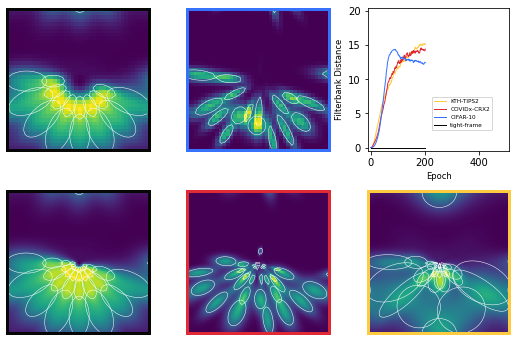

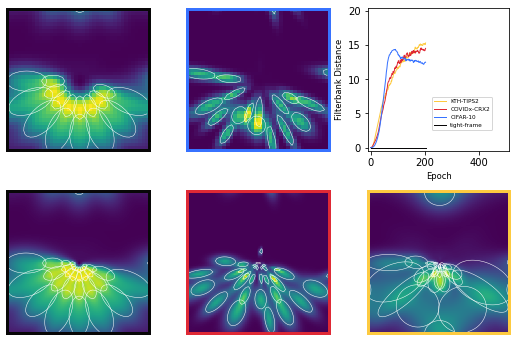

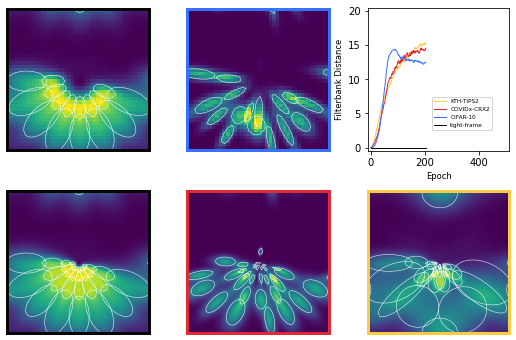

In [28]:
for frame in range(202,len(filterDists['cifar'])):
    # fig3 = plt.figure(figsize=(18,12))
    fig3 = plt.figure(figsize=(9,6))
    gs = fig3.add_gridspec(4,6,wspace=0.75, hspace=0.75)


    f3_ax1 = fig3.add_subplot(gs[0:2,4:6],xlabel="Epoch",ylabel="Filterbank Distance")#0:2,4:6
    f3_ax1.set_ylabel("Filterbank Distance", fontsize='small')
    f3_ax1.set_xlabel("Epoch",fontsize='small')
    WIDTH = 3
    epochs = [x for x in range(len(filterDists['cifar']))]

    f3_ax1.plot(epochs[:frame], filterDists['kth'][:frame], label="KTH-TIPS2", color="#FDCA40", linewidth=1)
    f3_ax1.plot(epochs[:frame], filterDists['xray'][:frame], label="COVIDx-CRX2", color="#DF2935", linewidth=1) 
    f3_ax1.plot(epochs[:frame], filterDists['cifar'][:frame], label="CIFAR-10", color="#3772FF", linewidth=1) 
    f3_ax1.plot(epochs[:frame], filterDists['tf'][:frame], label="tight-frame", color="#080708", linewidth=1)

    #E6E8E6
    f3_ax1.legend(fontsize='xx-small',bbox_to_anchor=(0.4, 0.0, 0.5, 0.4)) 
    f3_ax1.set_xlim(-10.5,510.5)
    f3_ax1.set_ylim(-0.5,20.5)


#     lwptf2 = lwp(S2,filters['tf2'])
    lwpcifar2 = lwp(S2,filters_list['cifar'][frame])
#     lwptf4 = lwp(S4,filters['tf4'])
    lwpxray4 = lwp(S4,filters_list['xray'][frame])
    lwpkth4 = lwp(S4,filters_list['kth'][frame])

    f4_ax_tf2 = fig3.add_subplot(gs[0:2,0:2])#0:2,0:2
    f4_ax_tf4 = fig3.add_subplot(gs[2:4,0:2])#2:4,0:2
    f4_ax_cifar2 = fig3.add_subplot(gs[0:2,2:4])
    f4_ax_xray4 = fig3.add_subplot(gs[2:4,2:4])
    f4_ax_kth4 = fig3.add_subplot(gs[2:4,4:6])#2:4,4:6

    for g,ax,k,J in [(lwptf2,f4_ax_tf2,'tf2',2),(lwpcifar2,f4_ax_cifar2,'cifar',2),(lwptf4,f4_ax_tf4,'tf4',4),(lwpxray4,f4_ax_xray4,'xray',4),(lwpkth4,f4_ax_kth4,'kth',4)]:
      ax.imshow(g)
      # ax.axis('off')#xmargin=10,ymargin=1)#'off')
      for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(WIDTH)
      # ax.axes.set_box_aspect(2)
      ax.set_xticklabels([])
      ax.set_yticklabels([])
      ax.set_aspect('equal')
      ax.tick_params(bottom=False,top=False,left=False,right=False)#,color='green', labelcolor='green',)
      for spine in ax.spines.values():
          spine.set_edgecolor(colors[k])

      if J==2:
    #     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
    #     S2.params_filters = params
        
        if k in ['tf2','tf4']:
            S2.update_parameters__(filters_list[k])
        else:
            S2.update_parameters__(filters_list[k][frame])
        gabors2 = morlets2(S2.grid, S2.params_filters[0], 
                                            S2.params_filters[1], S2.params_filters[2], 
                                            S2.params_filters[3], return_gabors=True).cpu().detach().numpy()
        print(gabors2.shape,type(gabors2))
        grid = S2.grid + 20
        for i in np.abs(gabors2) ** 2:
          wave = np.fft.fftshift(i.T)
          ax.contour(grid[0], grid[1], wave, 1, colors='white',linewidths=0.5)
      else:
        # print(J)
    #     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
    #     S4.params_filters = params
        
        if k in ['tf2','tf4']:
            S4.update_parameters__(filters_list[k])
        else:
            S4.update_parameters__(filters_list[k][frame])
        gabors4 = morlets2(S4.grid, S4.params_filters[0], 
                                            S4.params_filters[1], S4.params_filters[2], 
                                            S4.params_filters[3], return_gabors=True).cpu().detach().numpy()
        grid = S4.grid + 32
        for c,i in enumerate(np.abs(gabors4) ** 2):
          wave = np.fft.fftshift(i.T)
          # print(wave.shape)
          ax.contour(grid[0], grid[1], wave, levels=1, colors='white',linewidths=0.5)
          if c <= 32:
            for level in ax.collections:
                for kp,path in reversed(list(enumerate(level.get_paths()))):
                    # go in reversed order due to deletions!

                    # include test for "smallness" of your choice here:
                    # I'm using a simple estimation for the diameter based on the
                    #    x and y diameter...
                    verts = path.vertices # (N,2)-shape array of contour line coordinates
                    set1 = set([x for x in verts[:,0]])
                    set2 = set([x for x in verts[:,1]])

                    diameter = np.max(verts.max(axis=0) - verts.min(axis=0))
                    thresh = np.min([len(set1),len(set2)])
    #                     print(diameter,kp,len(path))
                    if thresh==1: # threshold to be refined for your actual dimensions!
                        print(verts.shape)
                        del(level.get_paths()[kp])  # no remove() for Path objects:(


    fig3.savefig("video_frames2/qualitative_viz_frame{}.png".format(frame),bbox_inches='tight',dpi=500)
#     fig3.savefig("graph_lwp_w{}_2-3.pdf".format(WIDTH),bbox_inches='tight')

# Making the video

In [20]:
import cv2
import os

image_folder = 'video_frames'
video_name = 'high_quality_video.avi'

images = [img for img in os.listdir(image_folder) if img.endswith(".png")]
images = ["{}/qualitative_viz_frame{}.png".format(image_folder,frame) for frame in range(len(images))]
frame = cv2.imread(images[0])
height, width, layers = frame.shape

a = cv2.imread(images[0])
a = cv2.pyrDown(a)
height,width,_ = a.shape

In [21]:
video = cv2.VideoWriter(video_name, 0, 50, (width,height))

for i,image in enumerate(images):
    if i % 25 ==0:
        print(i)
    print(image)
    a = cv2.imread(image)
    a = cv2.pyrDown(a)
#     print(a.shape)
    video.write(a)#cv2.imread(image))

cv2.destroyAllWindows()
video.release()

0
video_frames/qualitative_viz_frame0.png
video_frames/qualitative_viz_frame1.png
video_frames/qualitative_viz_frame2.png
video_frames/qualitative_viz_frame3.png
video_frames/qualitative_viz_frame4.png
video_frames/qualitative_viz_frame5.png
video_frames/qualitative_viz_frame6.png
video_frames/qualitative_viz_frame7.png
video_frames/qualitative_viz_frame8.png
video_frames/qualitative_viz_frame9.png
video_frames/qualitative_viz_frame10.png
video_frames/qualitative_viz_frame11.png
video_frames/qualitative_viz_frame12.png
video_frames/qualitative_viz_frame13.png
video_frames/qualitative_viz_frame14.png
video_frames/qualitative_viz_frame15.png
video_frames/qualitative_viz_frame16.png
video_frames/qualitative_viz_frame17.png
video_frames/qualitative_viz_frame18.png
video_frames/qualitative_viz_frame19.png
video_frames/qualitative_viz_frame20.png
video_frames/qualitative_viz_frame21.png
video_frames/qualitative_viz_frame22.png
video_frames/qualitative_viz_frame23.png
video_frames/qualitative

video_frames/qualitative_viz_frame198.png
video_frames/qualitative_viz_frame199.png
200
video_frames/qualitative_viz_frame200.png
video_frames/qualitative_viz_frame201.png
video_frames/qualitative_viz_frame202.png
video_frames/qualitative_viz_frame203.png
video_frames/qualitative_viz_frame204.png
video_frames/qualitative_viz_frame205.png
video_frames/qualitative_viz_frame206.png
video_frames/qualitative_viz_frame207.png
video_frames/qualitative_viz_frame208.png
video_frames/qualitative_viz_frame209.png
video_frames/qualitative_viz_frame210.png
video_frames/qualitative_viz_frame211.png
video_frames/qualitative_viz_frame212.png
video_frames/qualitative_viz_frame213.png
video_frames/qualitative_viz_frame214.png
video_frames/qualitative_viz_frame215.png
video_frames/qualitative_viz_frame216.png
video_frames/qualitative_viz_frame217.png
video_frames/qualitative_viz_frame218.png
video_frames/qualitative_viz_frame219.png
video_frames/qualitative_viz_frame220.png
video_frames/qualitative_viz_f

video_frames/qualitative_viz_frame393.png
video_frames/qualitative_viz_frame394.png
video_frames/qualitative_viz_frame395.png
video_frames/qualitative_viz_frame396.png
video_frames/qualitative_viz_frame397.png
video_frames/qualitative_viz_frame398.png
video_frames/qualitative_viz_frame399.png
400
video_frames/qualitative_viz_frame400.png
video_frames/qualitative_viz_frame401.png
video_frames/qualitative_viz_frame402.png
video_frames/qualitative_viz_frame403.png
video_frames/qualitative_viz_frame404.png
video_frames/qualitative_viz_frame405.png
video_frames/qualitative_viz_frame406.png
video_frames/qualitative_viz_frame407.png
video_frames/qualitative_viz_frame408.png
video_frames/qualitative_viz_frame409.png
video_frames/qualitative_viz_frame410.png
video_frames/qualitative_viz_frame411.png
video_frames/qualitative_viz_frame412.png
video_frames/qualitative_viz_frame413.png
video_frames/qualitative_viz_frame414.png
video_frames/qualitative_viz_frame415.png
video_frames/qualitative_viz_f

# Big version


/tmp/ipykernel_1755287/2784516722.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig3 = plt.figure(figsize=(18,12))


Frame: 475
Frame: 500


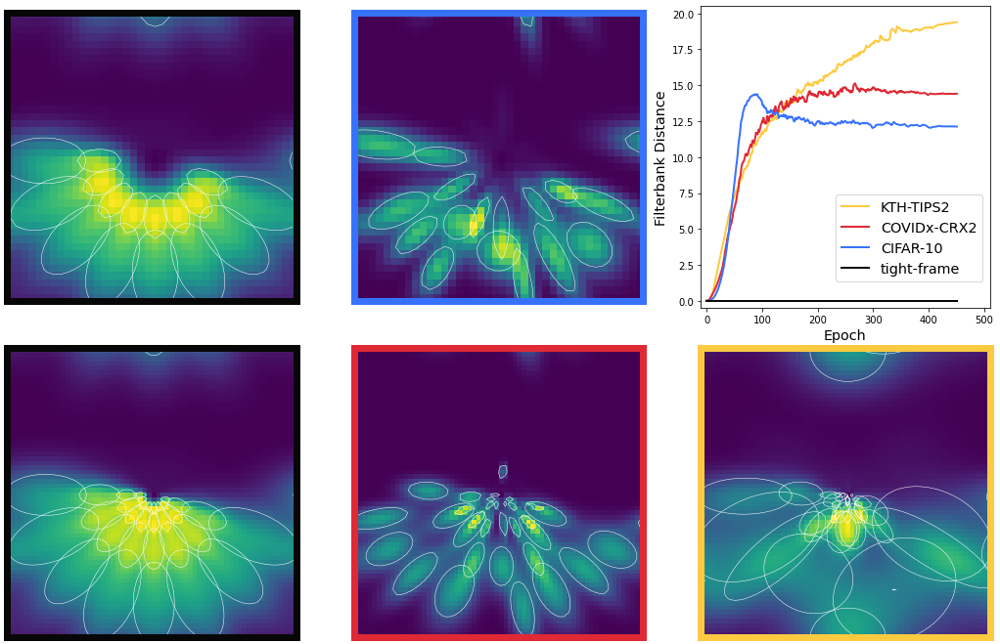

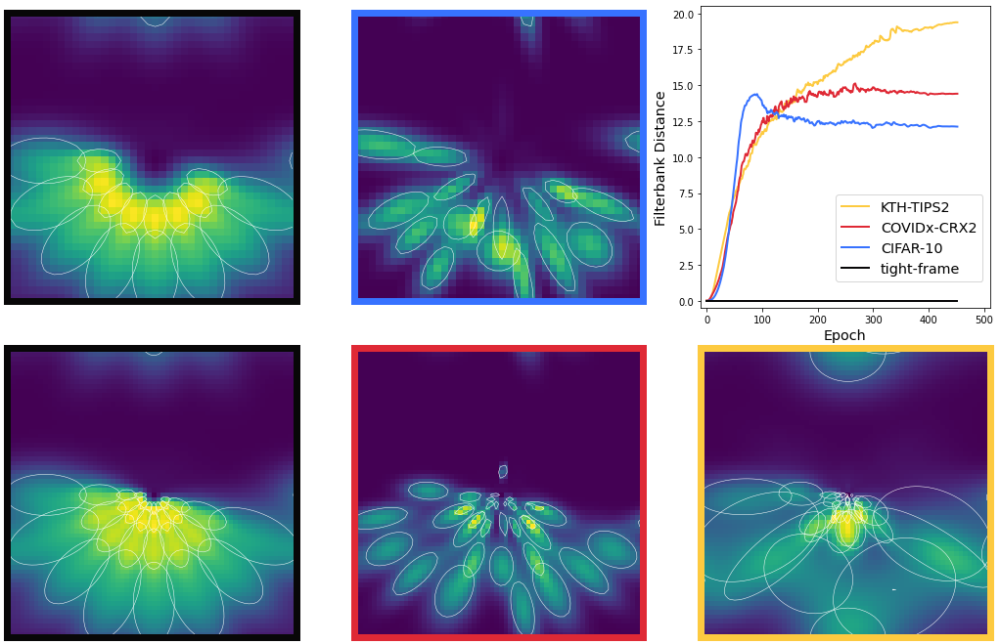

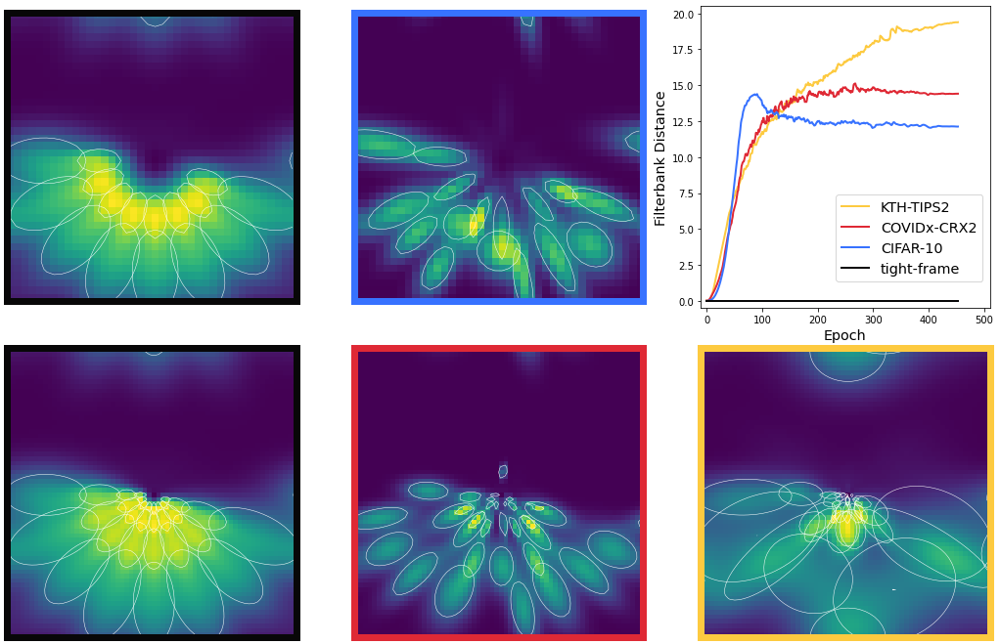

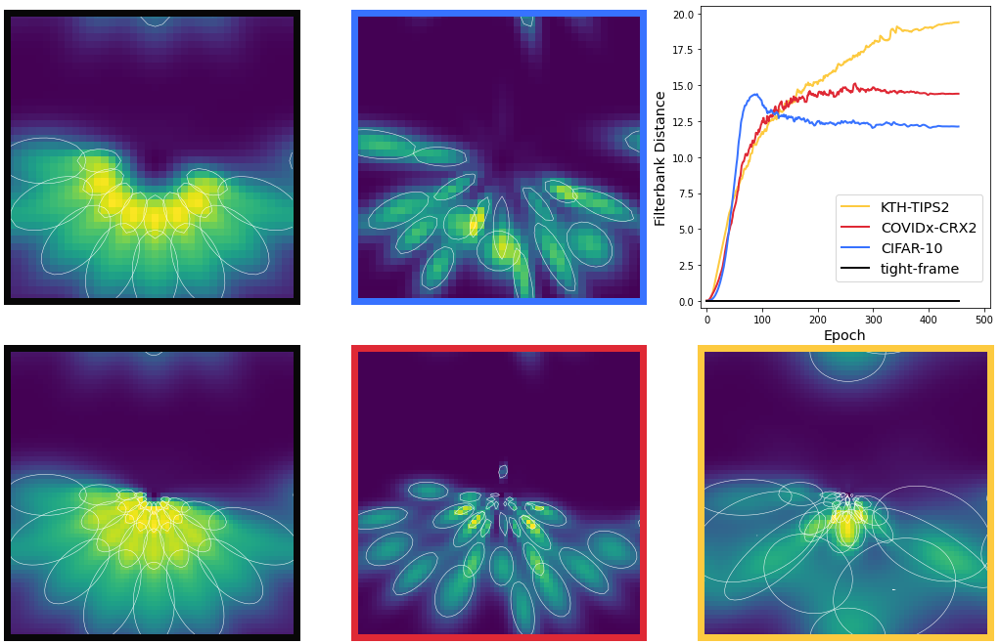

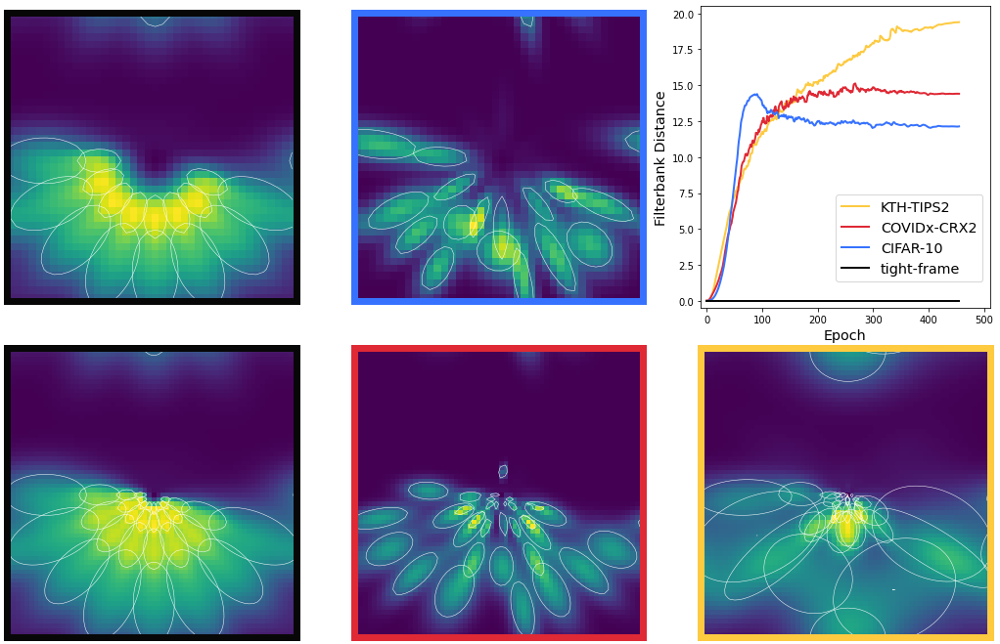

...

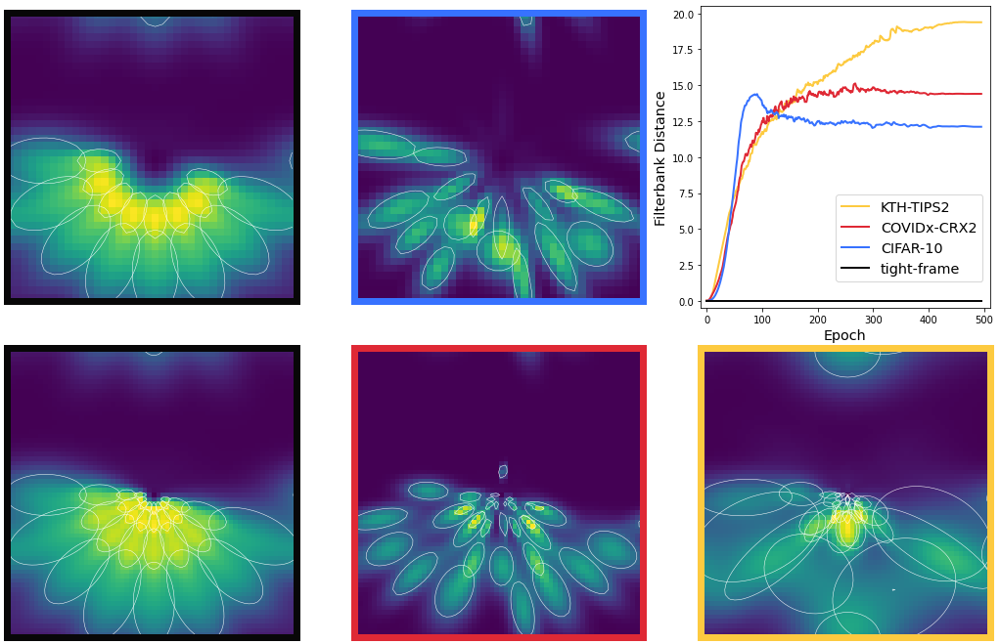

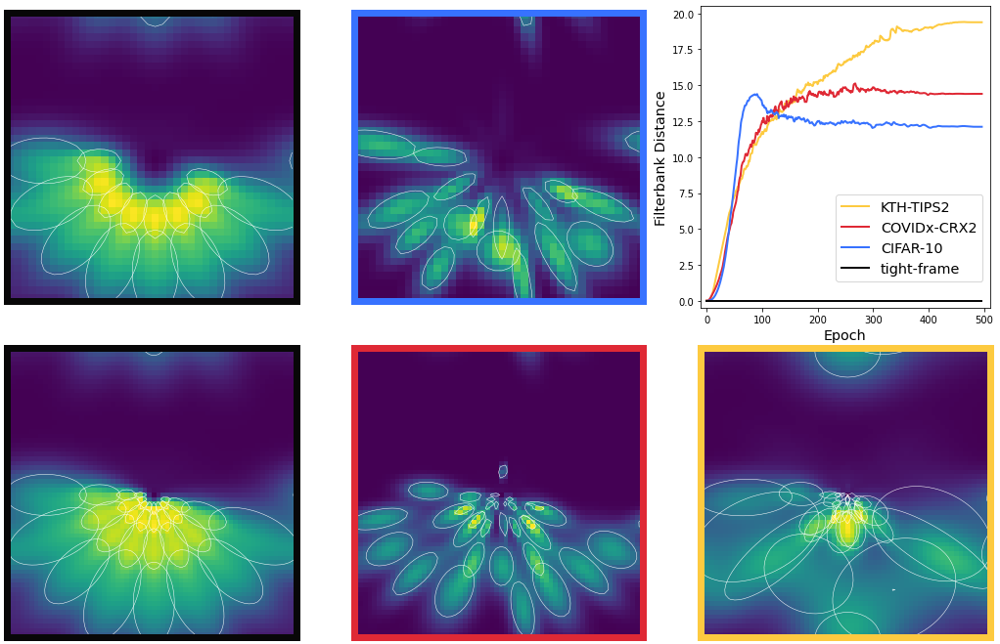

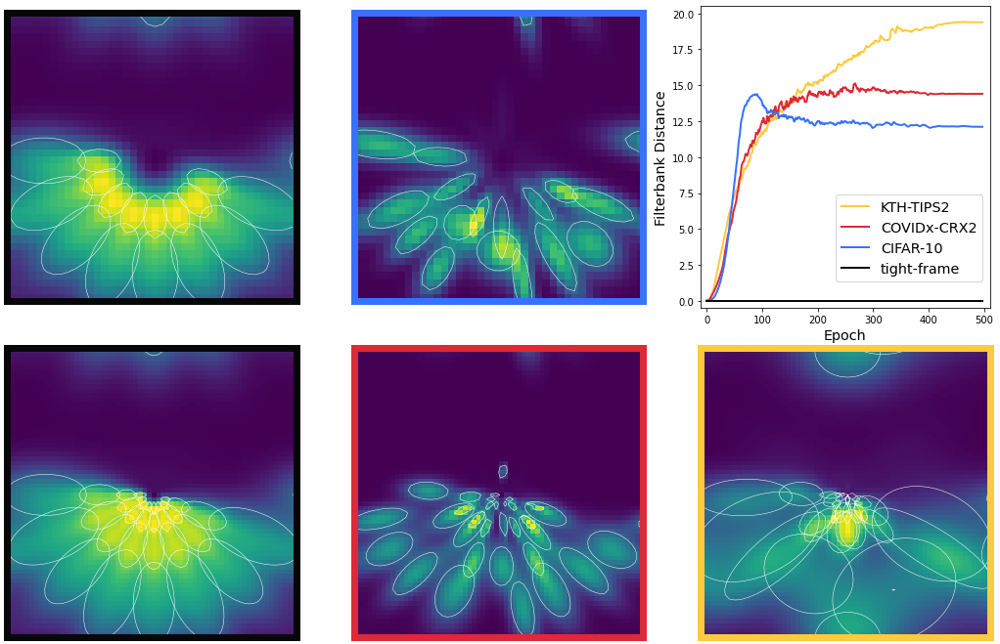

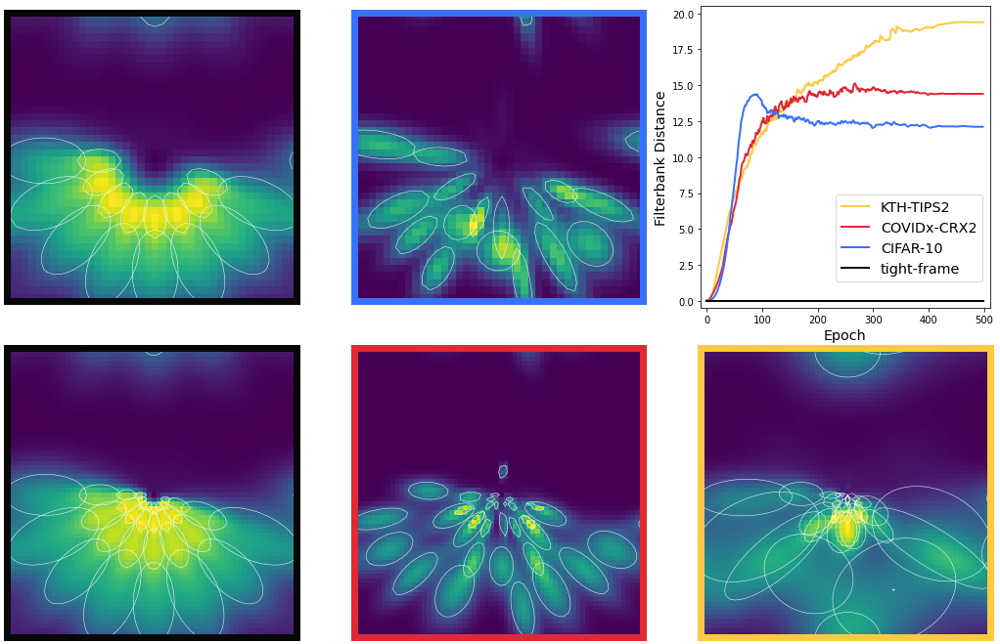

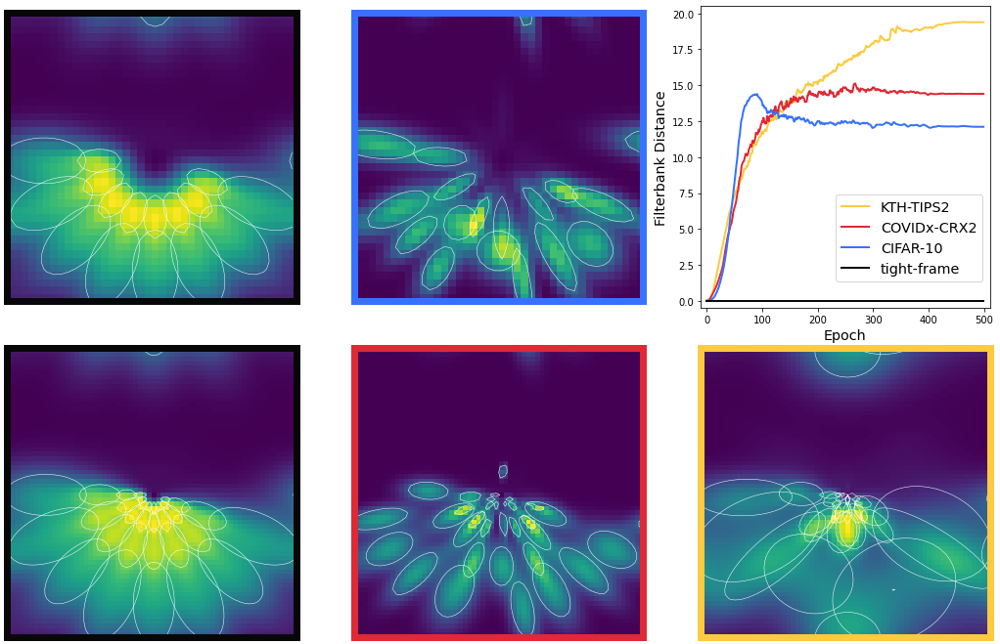

In [15]:
for frame in range(452,len(filterDists['cifar'])):
    if frame % 25 == 0:
        print("Frame:",frame)
    
    fig3 = plt.figure(figsize=(18,12))
    gs = fig3.add_gridspec(4,6,wspace=0.5, hspace=0.25)

    f3_ax1 = fig3.add_subplot(gs[0:2,4:6],xlabel="Epoch",ylabel="Filterbank Distance")#0:2,4:6
    f3_ax1.set_ylabel("Filterbank Distance", fontsize='x-large')
    f3_ax1.set_xlabel("Epoch",fontsize='x-large')
    
    WIDTH = 7

    f3_ax1.plot(epochs[:frame], filterDists['kth'][:frame], label="KTH-TIPS2", color="#FDCA40", linewidth=2)
    f3_ax1.plot(epochs[:frame], filterDists['xray'][:frame], label="COVIDx-CRX2", color="#DF2935", linewidth=2) 
    f3_ax1.plot(epochs[:frame], filterDists['cifar'][:frame], label="CIFAR-10", color="#3772FF", linewidth=2) 
    f3_ax1.plot(epochs[:frame], filterDists['tf'][:frame], label="tight-frame", color="#080708", linewidth=2)
    f3_ax1.set_xlim(-10.5,510.5)
    f3_ax1.set_ylim(-0.5,20.5)
    #E6E8E6
    f3_ax1.legend(fontsize='x-large',bbox_to_anchor=(0.5, 0., 0.5, 0.4)) 

#     lwptf2 = lwp(S2,filters['tf2'])
    lwpcifar2 = lwp(S2,filters_list['cifar'][frame])
#     lwptf4 = lwp(S4,filters['tf4'])
    lwpxray4 = lwp(S4,filters_list['xray'][frame])
    lwpkth4 = lwp(S4,filters_list['kth'][frame])

    f4_ax_tf2 = fig3.add_subplot(gs[0:2,0:2])#0:2,0:2
    f4_ax_tf4 = fig3.add_subplot(gs[2:4,0:2])#2:4,0:2
    f4_ax_cifar2 = fig3.add_subplot(gs[0:2,2:4])
    f4_ax_xray4 = fig3.add_subplot(gs[2:4,2:4])
    f4_ax_kth4 = fig3.add_subplot(gs[2:4,4:6])#2:4,4:6

    for g,ax,k,J in [(lwptf2,f4_ax_tf2,'tf2',2),(lwpcifar2,f4_ax_cifar2,'cifar',2),(lwptf4,f4_ax_tf4,'tf4',4),(lwpxray4,f4_ax_xray4,'xray',4),(lwpkth4,f4_ax_kth4,'kth',4)]:
      ax.imshow(g)
      # ax.axis('off')#xmargin=10,ymargin=1)#'off')
      for axis in ['top','bottom','left','right']:
        ax.spines[axis].set_linewidth(WIDTH)
      # ax.axes.set_box_aspect(2)
      ax.set_xticklabels([])
      ax.set_yticklabels([])
      ax.set_aspect('equal')
      ax.tick_params(bottom=False,top=False,left=False,right=False)#,color='green', labelcolor='green',)
      for spine in ax.spines.values():
          spine.set_edgecolor(colors[k])
      if J==2:
    #     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
    #     S2.params_filters = params
        if k in ['tf2','tf4']:
            S2.update_parameters__(filters_list[k])
        else:
            S2.update_parameters__(filters_list[k][frame])
        gabors2 = morlets2(S2.grid, S2.params_filters[0], 
                                            S2.params_filters[1], S2.params_filters[2], 
                                            S2.params_filters[3], return_gabors=False).cpu().detach().numpy()
        grid = S2.grid + 20
        for i in np.abs(gabors2) ** 2:
          wave = np.fft.fftshift(i.T)
          ax.contour(grid[0], grid[1], wave, 1, colors='white',linewidths=0.5)
      else:
        # print(J)
    #     params = [torch.tensor([float(x) for x in y],dtype=torch.float32) for y in filters[k]]
    #     S4.params_filters = params
        if k in ['tf2','tf4']:
            S4.update_parameters__(filters_list[k])
        else:
            S4.update_parameters__(filters_list[k][frame])
        gabors4 = morlets2(S4.grid, S4.params_filters[0], 
                                            S4.params_filters[1], S4.params_filters[2], 
                                            S4.params_filters[3], return_gabors=True).cpu().detach().numpy()
        grid = S4.grid + 32
        for c,i in enumerate(np.abs(gabors4) ** 2):
          wave = np.fft.fftshift(i.T)
          # print(wave.shape)
          ax.contour(grid[0], grid[1], wave, levels=1, colors='white',linewidths=0.5)
          if c <= 32:
            for level in ax.collections:
                for kp,path in reversed(list(enumerate(level.get_paths()))):
                    # go in reversed order due to deletions!

                    # include test for "smallness" of your choice here:
                    # I'm using a simple estimation for the diameter based on the
                    #    x and y diameter...
                    verts = path.vertices # (N,2)-shape array of contour line coordinates
                    set1 = set([x for x in verts[:,0]])
                    set2 = set([x for x in verts[:,1]])

                    diameter = np.max(verts.max(axis=0) - verts.min(axis=0))
                    thresh = np.min([len(set1),len(set2)])
    #                     print(diameter,kp,len(path))
                    if thresh==1: # threshold to be refined for your actual dimensions!
#                         print(verts.shape)
                        del(level.get_paths()[kp])  # no remove() for Path objects:(


    fig3.savefig("video_frames/qualitative_viz_frame{}.png".format(frame),bbox_inches='tight',dpi=500)
    